In [1]:

import wandb
import pandas as pd
import re
import datetime
from dateutil import relativedelta
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
from copy import deepcopy
import seaborn as sns



def obtain_confusion_matrix(path,group):
    """
    This function retrieves the confusion matrices from the Weights & Biases (wandb) runs for a given path.

    Parameters:
    path (str): The path of the wandb runs.
    group (str): Filter which group should grab the information from. 

    Returns:
    cross_val_sic (list): A list of dataframes containing the cross-validation results for SIC.
    cross_val_sod (list): A list of dataframes containing the cross-validation results for SOD.
    cross_val_floe (list): A list of dataframes containing the cross-validation results for FLOE.
    test_sic (list): A list of dataframes containing the test results for SIC.
    test_sod (list): A list of dataframes containing the test results for SOD.
    test_floe (list): A list of dataframes containing the test results for FLOE.

    Note:
    The function uses the wandb API to access the runs. For each run, it retrieves the logged artifacts. 
    If an artifact is of type 'confusion_matrix', it checks if it belongs to 'Cross_Validation' or 'Test'. 
    Depending on the name_results, it appends the dataframe to the corresponding list. 
    If an error occurs while retrieving the artifacts, it prints an error message with the run details.

    """

    # open the wandb api
    api = wandb.Api()

    # Get the runs
    runs = api.runs(path=path,filters={'group':group})

    cross_val_sic = []
    cross_val_sod = []
    cross_val_floe = []

    test_sic = []
    test_sod = []
    test_floe = []

    # Get the validation tables for each run
    for run in runs:
        artifacts = run.logged_artifacts()
        
        # Try to get the artifacts in each run. Sometimes it is not possible. 
        try:
            for artifact in artifacts:
                    
                    if artifact.type == 'confusion_matrix':
                        if 'Cross_Validation' in artifact.name:

                            name_results = list(artifact.manifest.entries.values())[0].path.split('.')[0]

                            df = artifact.get(name_results).get_dataframe()
                            df.attrs = {'name':run.id}

                            if 'SIC' in name_results:
                                cross_val_sic.append(df)
                            elif 'SOD' in name_results:
                                cross_val_sod.append(df)
                            elif 'FLOE' in name_results:
                                cross_val_floe.append(df)
                            
                            
                        if 'Test' in artifact.name:
                            name_results = list(artifact.manifest.entries.values())[0].path.split('.')[0]
                            df = artifact.get(name_results).get_dataframe()
                            df.attrs = {'name':run.id}

                            if 'SIC' in name_results:
                                test_sic.append(df)
                            elif 'SOD' in name_results:
                                test_sod.append(df)
                            elif 'FLOE' in name_results:
                                test_floe.append(df)
                            
                            
        except:
            print(f'Error happened. Run:{run}')

    return cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe


def get_mean_df(df_list):
    """
    This function calculates the mean of a list of dataframes.

    Parameters:
    df_list (list): A list of pandas dataframes. All dataframes should have the same structure.

    Returns:
    df_mean (DataFrame): A dataframe that contains the mean values of the input dataframes.

    Note:
    The function assumes that all dataframes in df_list have the same columns and index. 
    It stacks all the dataframes along a new third axis using numpy's dstack function. 
    Then it calculates the mean along this new axis, ignoring NaN values. 
    Finally, it creates a new dataframe with these mean values, using the column names from the original dataframes.
    """

    group_names = df_list[0].columns.tolist()

    data_dstack = np.dstack([x.values for x in df_list])

    data_mean = np.nanmean(data_dstack,axis=2)

    df_mean = pd.DataFrame(data_mean,index = group_names, columns = group_names )

    return df_mean



def display_cm(df, title, cmap, rot=0, colour_bar_min_max = None, save_figure=None):
    """
    This function displays a confusion matrix using seaborn's heatmap.

    Parameters:
    df (DataFrame): A pandas dataframe that represents the confusion matrix.
    title (str): The title of the plot.
    rot (int, optional): The rotation angle for y-axis labels. Default is 0.
    colour_bar_min_max (list, optional): The min and max values for the colour bar
    Returns:
    None

    Note:
    The function uses seaborn's heatmap function to display the confusion matrix. 
    It sets the x-axis labels as 'Predicted Labels' and the y-axis labels as 'Actual Labels'. 
    The rotation angle for y-axis labels can be adjusted with the 'rot' parameter.
    
    """

    # Round down to one decimal
    df=df.round(1)

    group_names = df.columns.tolist()


    plt.figure(figsize=(10, 8))
    if colour_bar_min_max is not None:
        ax = sns.heatmap(df.values, annot=True, cmap=cmap,annot_kws={"size": 12}, vmin=colour_bar_min_max[0], vmax=colour_bar_min_max[1])
    else:
        ax = sns.heatmap(df.values, annot=True, cmap=cmap,annot_kws={"size": 12})
    

    tick_marks = np.arange(len(group_names)) + 0.5

    plt.xticks(tick_marks, group_names, rotation=rot, fontsize=11)

    plt.yticks(tick_marks, group_names, rotation=rot, fontsize=11)

    plt.xlabel('Predicted Labels',fontsize=12)
    plt.ylabel('Actual Labels', fontsize=12)
    plt.title(title, fontsize=14)

    cbar = ax.collections[0].colorbar

    cbar.ax.tick_params(axis='both', which='major', labelsize=14) 

    if save_figure is not None:
        plt.savefig(save_figure)
    

In [2]:



path = 'ai4arctic/feature_selection_rerun_inference'
group = 'rerun_base'

cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)



wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downlo

In [3]:





cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe

mean_cv_sic = get_mean_df(cross_val_sic)
mean_cv_sod = get_mean_df(cross_val_sod)
mean_cv_floe = get_mean_df(cross_val_floe)

mean_test_sic = get_mean_df(test_sic)
mean_test_sod = get_mean_df(test_sod)
mean_test_floe = get_mean_df(test_floe)




/tmp/ipykernel_216627/841990265.py:116: RuntimeWarning: Mean of empty slice
  data_mean = np.nanmean(data_dstack,axis=2)


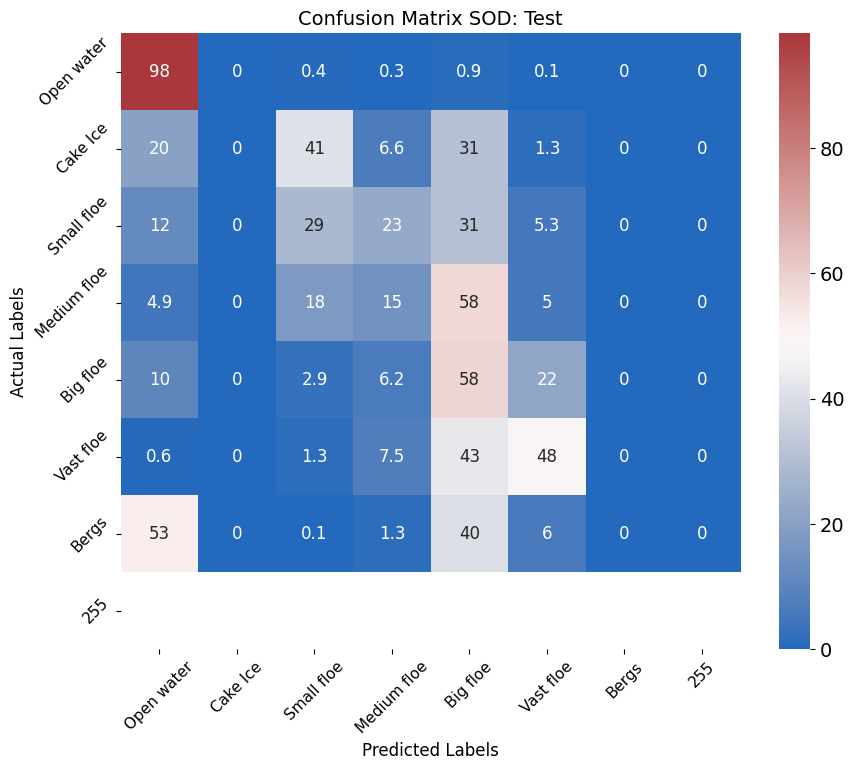

In [6]:


display_cm(mean_test_floe,'Confusion Matrix SOD: Test','vlag',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sod')

In [ ]:


path = 'ai4arctic/feature_selection_rerun_inference'
group = 'rerun_base'


group_list = ['remove_IA','remove_distance_map','remove_amsr2','remove_enviromental','remove_location','remove_time','remove_time_location']





cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)

base_mean_cv_sic = get_mean_df(cross_val_sic)
base_mean_cv_sod = get_mean_df(cross_val_sod)
base_mean_cv_floe = get_mean_df(cross_val_floe)

base_mean_test_sic = get_mean_df(test_sic)
base_mean_test_sod = get_mean_df(test_sod)
base_mean_test_floe = get_mean_df(test_floe)



for group in group_list:
    cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)

    mean_cv_sic = get_mean_df(cross_val_sic)
    mean_cv_sod = get_mean_df(cross_val_sod)
    mean_cv_floe = get_mean_df(cross_val_floe)

    mean_test_sic = get_mean_df(test_sic)
    mean_test_sod = get_mean_df(test_sod)
    mean_test_floe = get_mean_df(test_floe)



    mean_cv_sic.loc[:,:] = mean_cv_sic.values - base_mean_cv_sic.values
    mean_cv_sod.loc[:,:] = mean_cv_sod.values - base_mean_cv_sod.values 
    mean_cv_floe.loc[:,:] = mean_cv_floe.values - base_mean_cv_floe.values 

    mean_test_sic.loc[:,:] = mean_test_sic.values - base_mean_test_sic.values
    mean_test_sod.loc[:,:] = mean_test_sod.values - base_mean_test_sod.values
    mean_test_floe.loc[:,:] = mean_test_floe.values - base_mean_test_floe.values 


    display_cm(mean_test_sod,'Confusion Matrix SOD: Test','vlag',rot=45,save_figure = 'confusion_matrixes/remove_comparison/'+group+'_test_sod')
    display_cm(mean_cv_sod,'Confusion Matrix SOD: Cross Val','vlag',rot=45,save_figure = 'confusion_matrixes/remove_comparison/'+group+'_cv_sod')
    display_cm(mean_test_sic,'Confusion Matrix SIC: Test','vlag',rot=45,save_figure = 'confusion_matrixes/remove_comparison/'+group+'_test_sic')
    display_cm(mean_cv_sic,'Confusion Matrix SIC: Cross Val','vlag',rot=45,save_figure = 'confusion_matrixes/remove_comparison/'+group+'_cv_sic')
    display_cm(mean_test_floe,'Confusion Matrix FLOE: Test','vlag',rot=45,save_figure = 'confusion_matrixes/remove_comparison/'+group+'_test_floe')
    display_cm(mean_cv_floe,'Confusion Matrix FLOE: Cross Val','vlag',rot=45,save_figure = 'confusion_matrixes/remove_comparison/'+group+'_cv_floe')



wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downlo

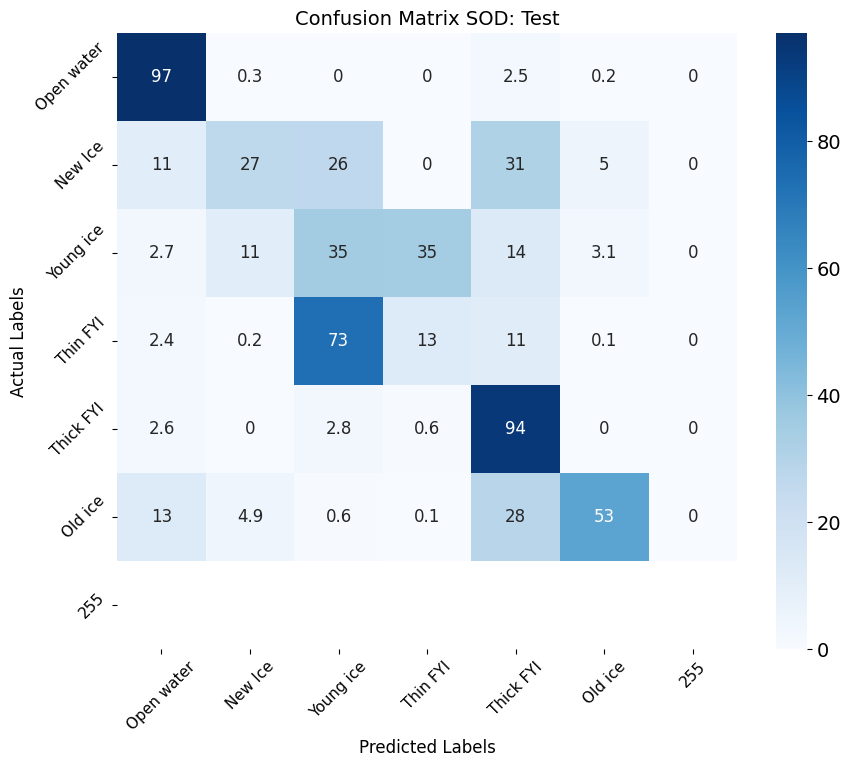

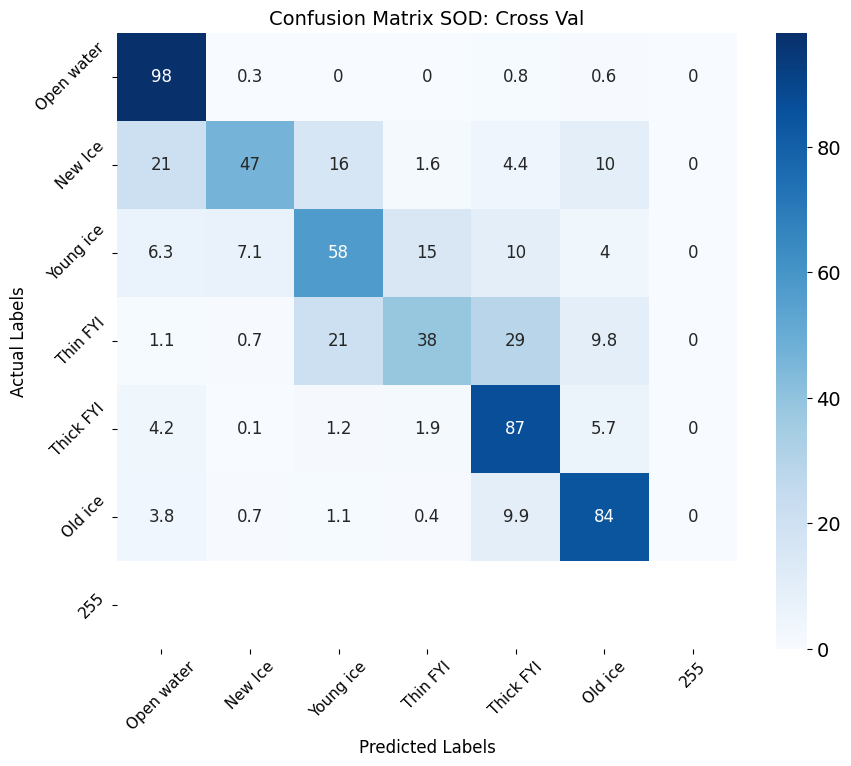

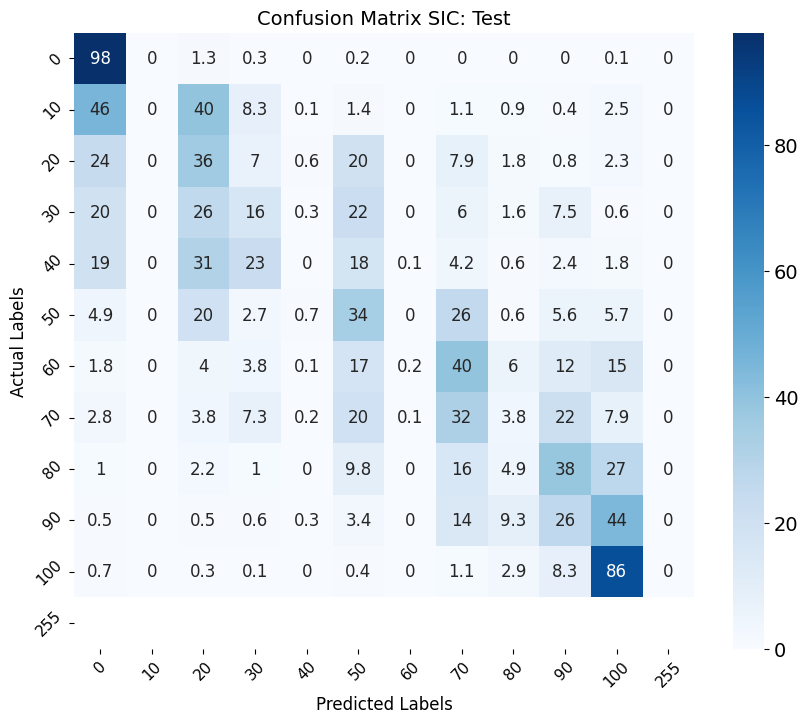

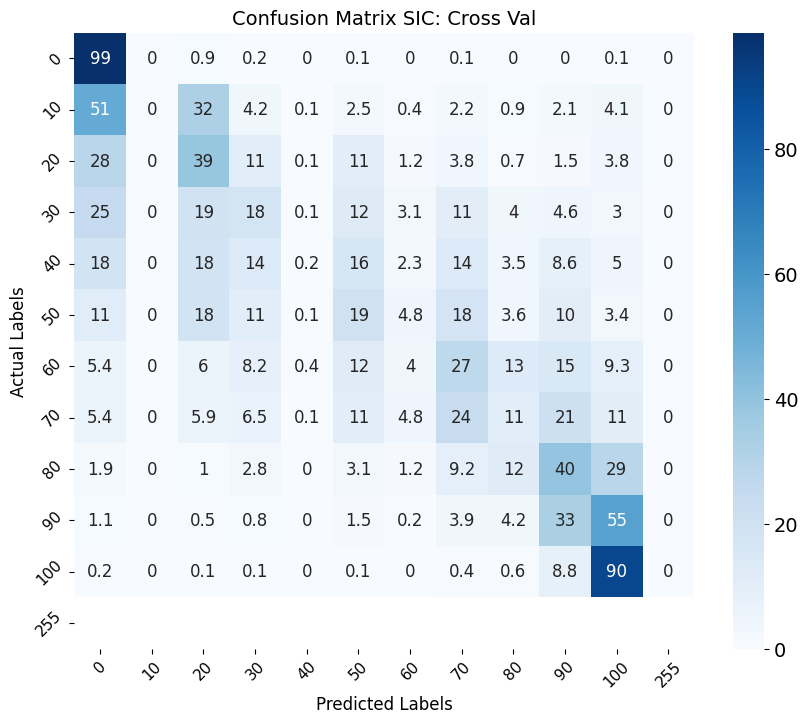

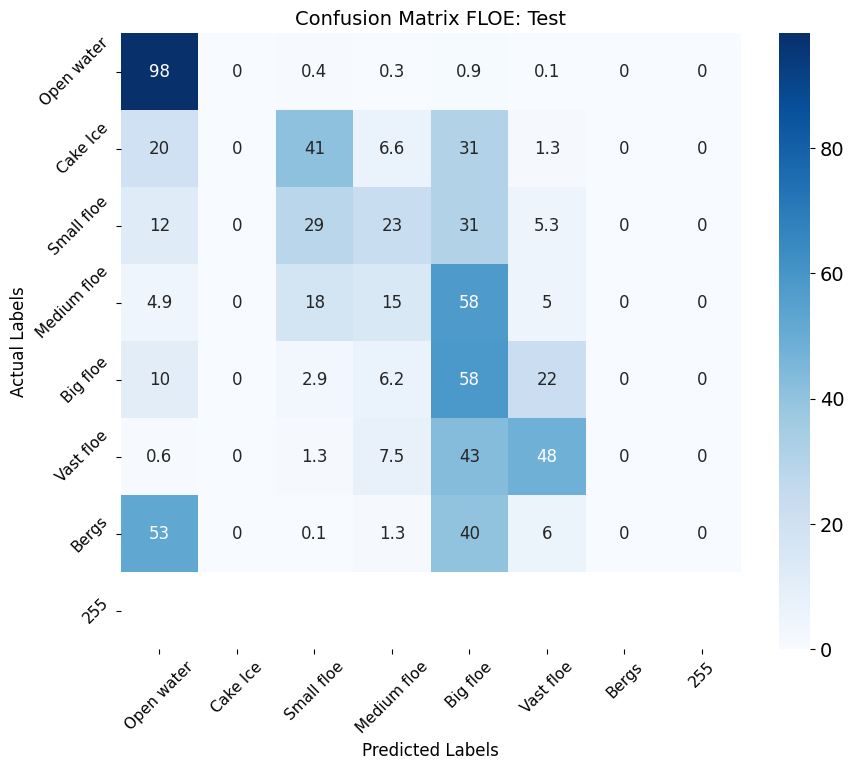

...

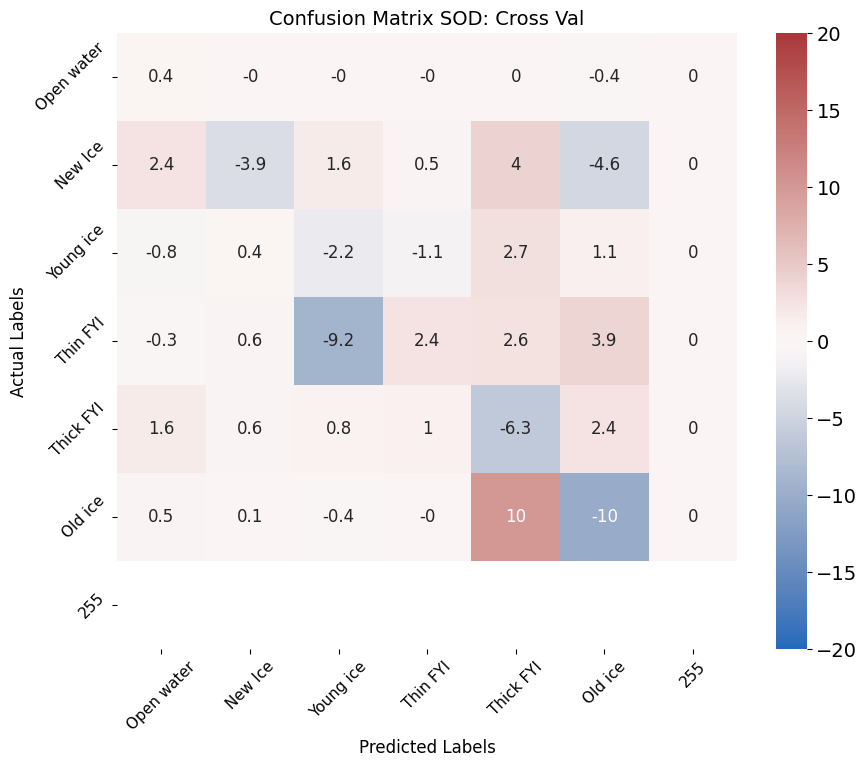

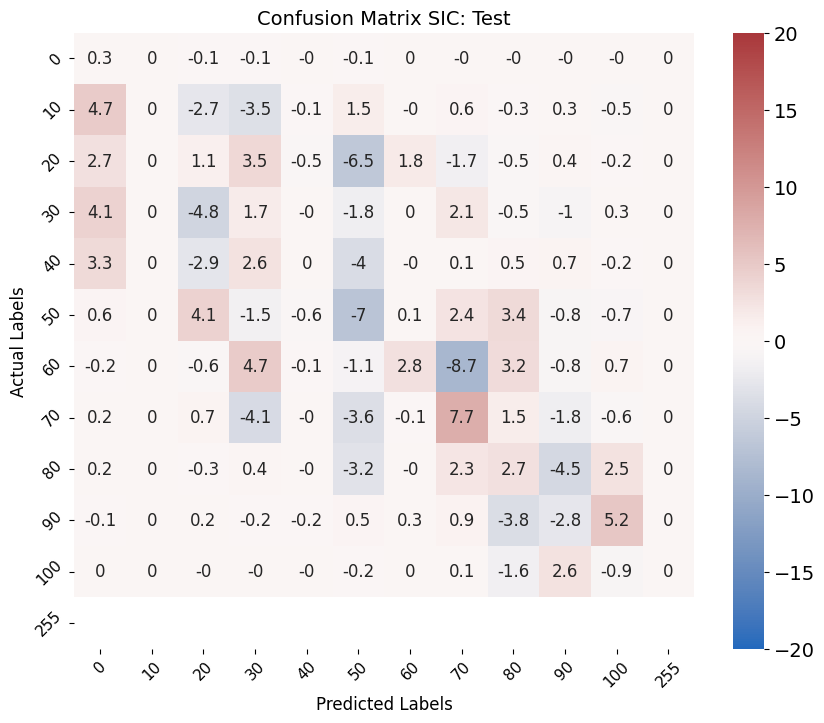

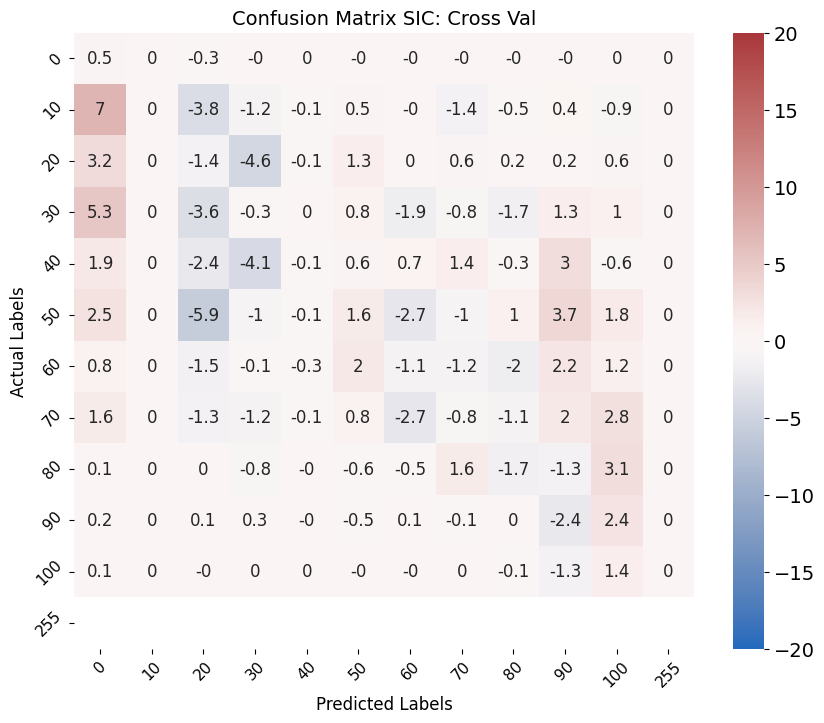

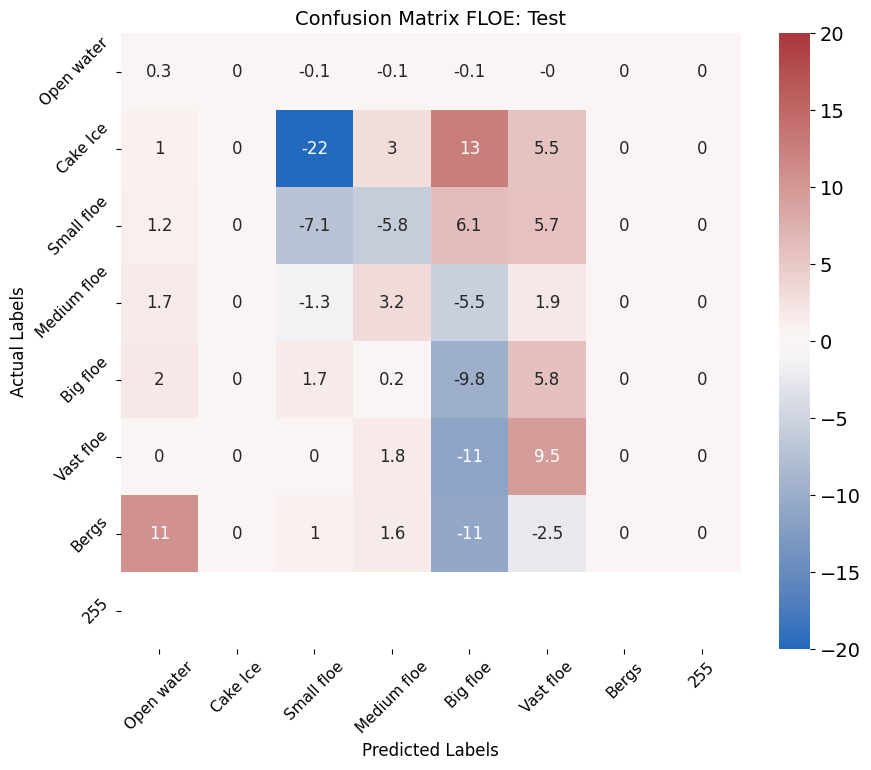

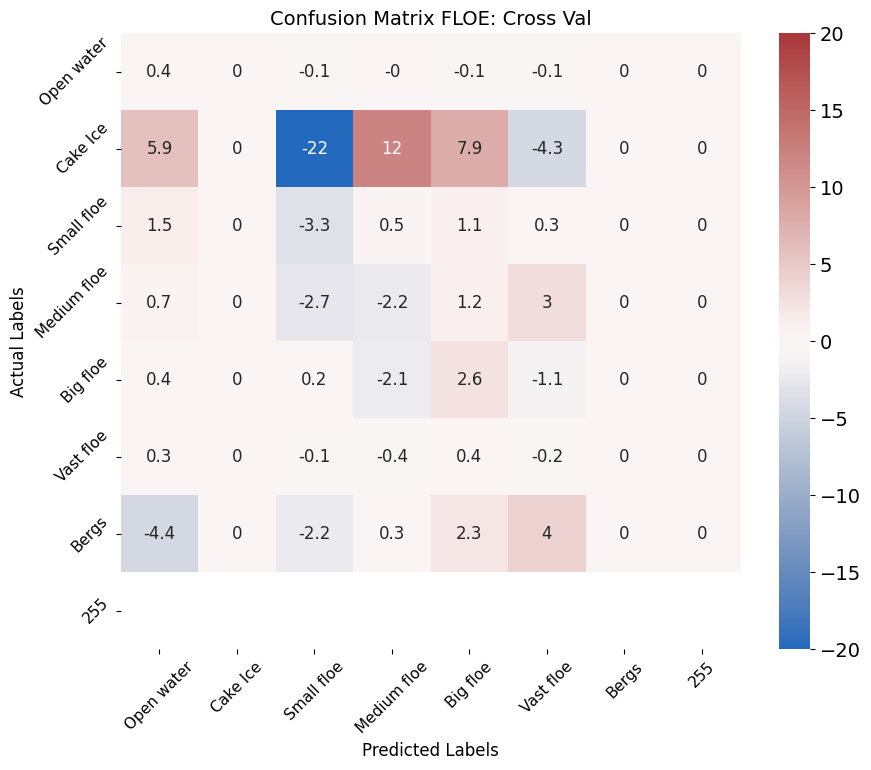

In [7]:
path = 'ai4arctic/feature_selection_rerun_inference'
group = 'rerun_base'



path_list = ['ai4arctic/feature_selection_rerun_inference_3',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference']

group_list = ['remove_IA','remove_distance_map','remove_amsr2','remove_enviromental','remove_location','remove_time','remove_time_location']



cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)

base_mean_cv_sic = get_mean_df(cross_val_sic)
base_mean_cv_sod = get_mean_df(cross_val_sod)
base_mean_cv_floe = get_mean_df(cross_val_floe)

base_mean_test_sic = get_mean_df(test_sic)
base_mean_test_sod = get_mean_df(test_sod)
base_mean_test_floe = get_mean_df(test_floe)



display_cm(base_mean_test_sod,'Confusion Matrix SOD: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sod')
display_cm(base_mean_cv_sod,'Confusion Matrix SOD: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sod')
display_cm(base_mean_test_sic,'Confusion Matrix SIC: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sic')
display_cm(base_mean_cv_sic,'Confusion Matrix SIC: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sic')
display_cm(base_mean_test_floe,'Confusion Matrix FLOE: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_floe')
display_cm(base_mean_cv_floe,'Confusion Matrix FLOE: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_floe')




for path, group in zip(path_list,group_list):
    cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)

    mean_cv_sic = get_mean_df(cross_val_sic)
    mean_cv_sod = get_mean_df(cross_val_sod)
    mean_cv_floe = get_mean_df(cross_val_floe)

    mean_test_sic = get_mean_df(test_sic)
    mean_test_sod = get_mean_df(test_sod)
    mean_test_floe = get_mean_df(test_floe)


    mean_cv_sic_diff = mean_cv_sic.copy(deep=True)
    mean_cv_sod_diff = mean_cv_sod.copy(deep=True)
    mean_cv_floe_diff = mean_cv_floe.copy(deep=True)

    mean_test_sic_diff = mean_test_sic.copy(deep=True)
    mean_test_sod_diff = mean_test_sod.copy(deep=True)
    mean_test_floe_diff = mean_test_floe.copy(deep=True)



    mean_cv_sic_diff.loc[:,:] = mean_cv_sic.values - base_mean_cv_sic.values
    mean_cv_sod_diff.loc[:,:] = mean_cv_sod.values - base_mean_cv_sod.values 
    mean_cv_floe_diff.loc[:,:] = mean_cv_floe.values - base_mean_cv_floe.values 

    mean_test_sic_diff.loc[:,:] = mean_test_sic.values - base_mean_test_sic.values
    mean_test_sod_diff.loc[:,:] = mean_test_sod.values - base_mean_test_sod.values
    mean_test_floe_diff.loc[:,:] = mean_test_floe.values - base_mean_test_floe.values 


    display_cm(mean_test_sod,'Confusion Matrix SOD: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sod')
    display_cm(mean_cv_sod,'Confusion Matrix SOD: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sod')
    display_cm(mean_test_sic,'Confusion Matrix SIC: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sic')
    display_cm(mean_cv_sic,'Confusion Matrix SIC: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sic')
    display_cm(mean_test_floe,'Confusion Matrix FLOE: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_floe')
    display_cm(mean_cv_floe,'Confusion Matrix FLOE: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_floe')



    display_cm(mean_test_sod_diff,'Confusion Matrix SOD: Test','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_test_sod')
    display_cm(mean_cv_sod_diff,'Confusion Matrix SOD: Cross Val','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_cv_sod')
    display_cm(mean_test_sic_diff,'Confusion Matrix SIC: Test','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_test_sic')
    display_cm(mean_cv_sic_diff,'Confusion Matrix SIC: Cross Val','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_cv_sic')
    display_cm(mean_test_floe_diff,'Confusion Matrix FLOE: Test','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_test_floe')
    display_cm(mean_cv_floe_diff,'Confusion Matrix FLOE: Cross Val','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_cv_floe')




wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downlo

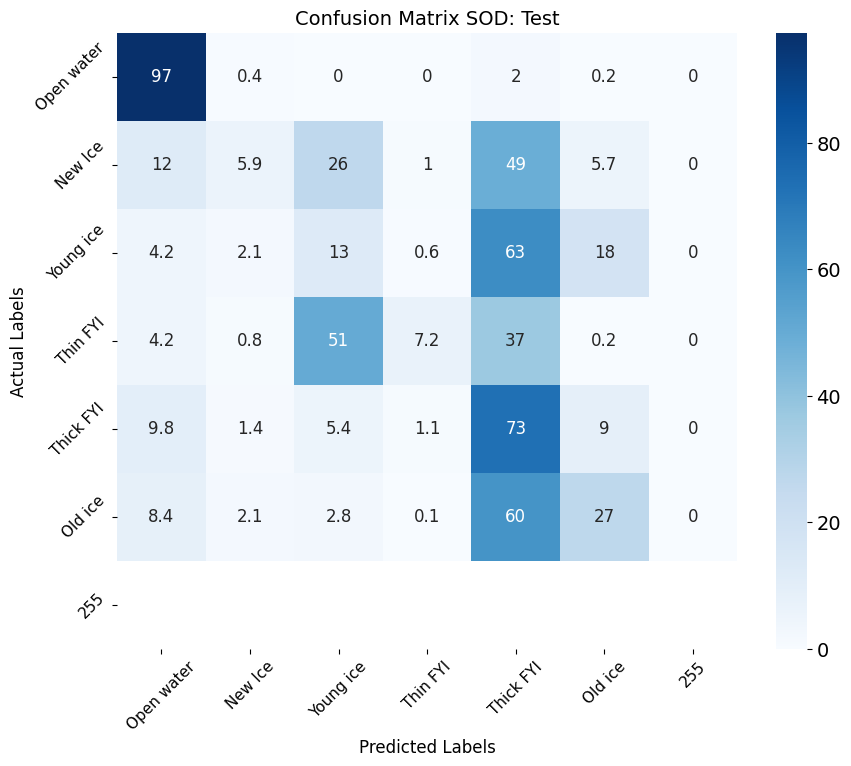

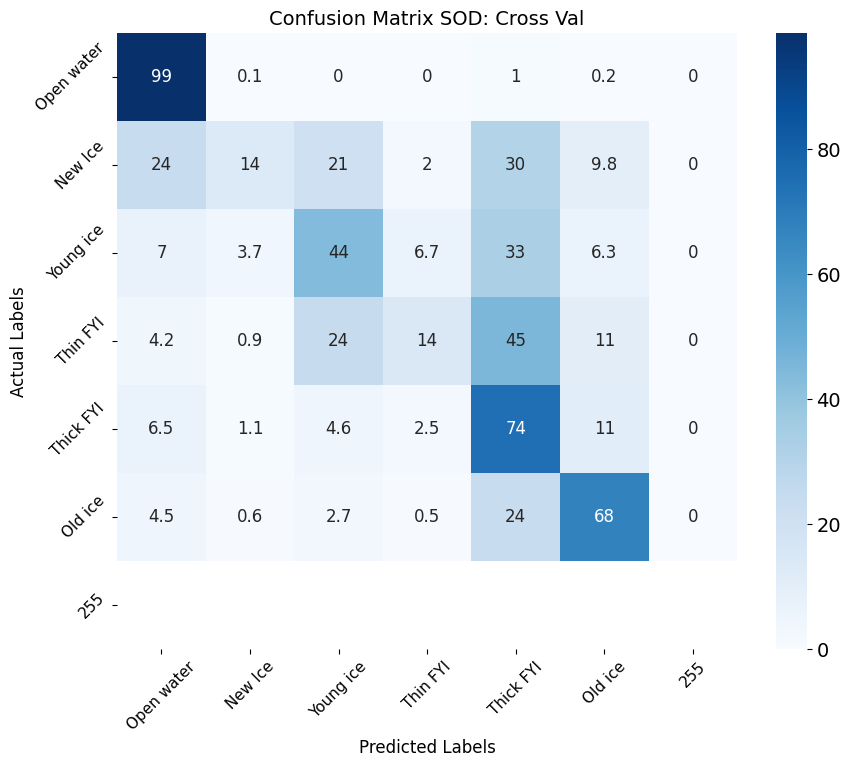

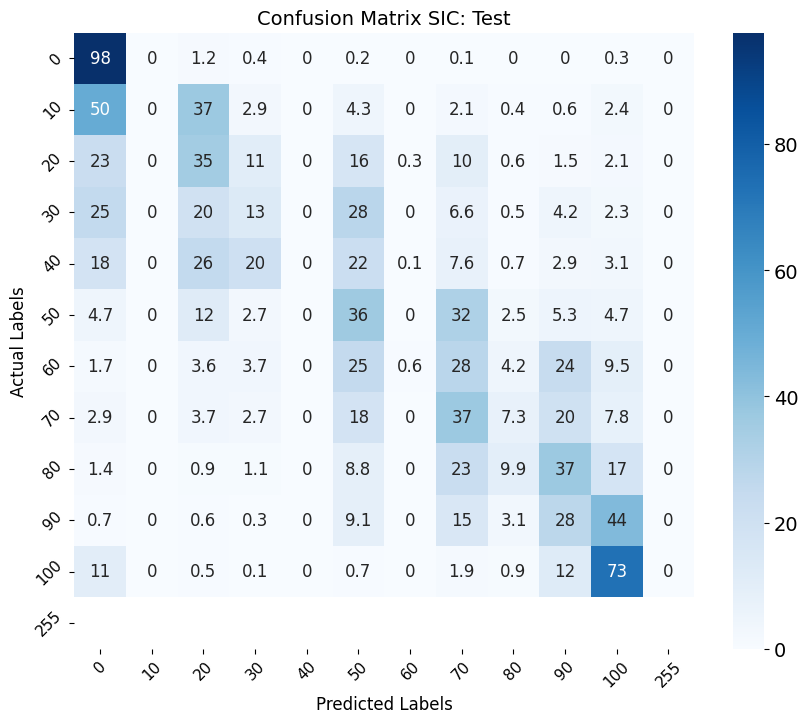

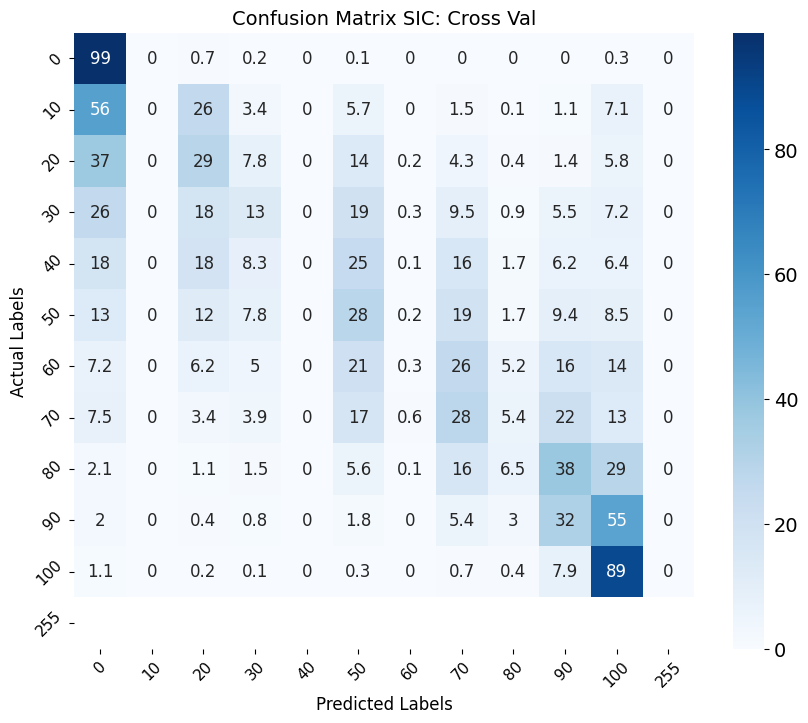

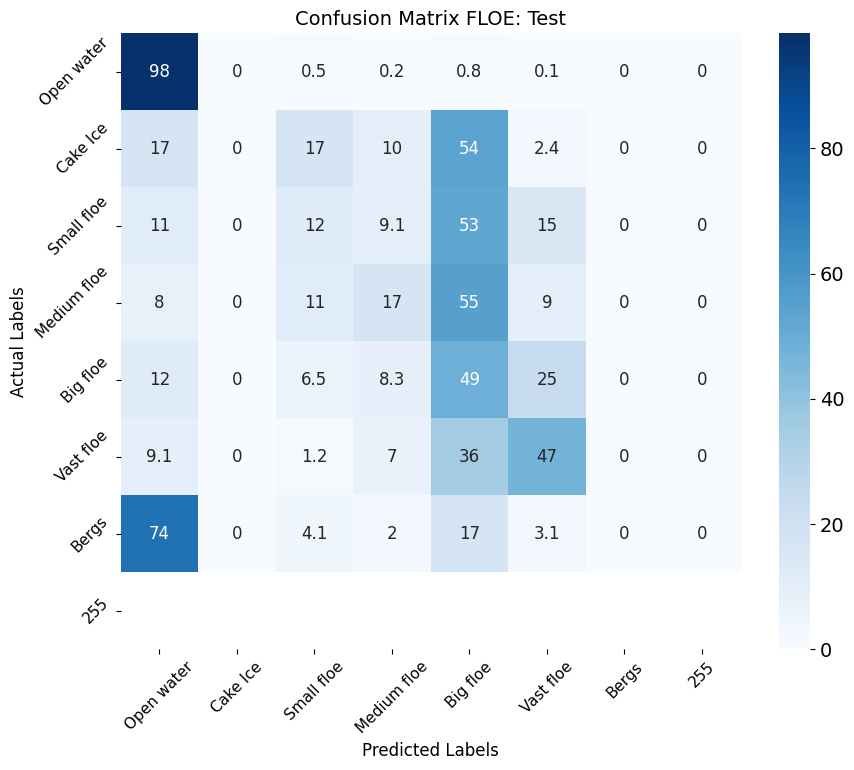

...

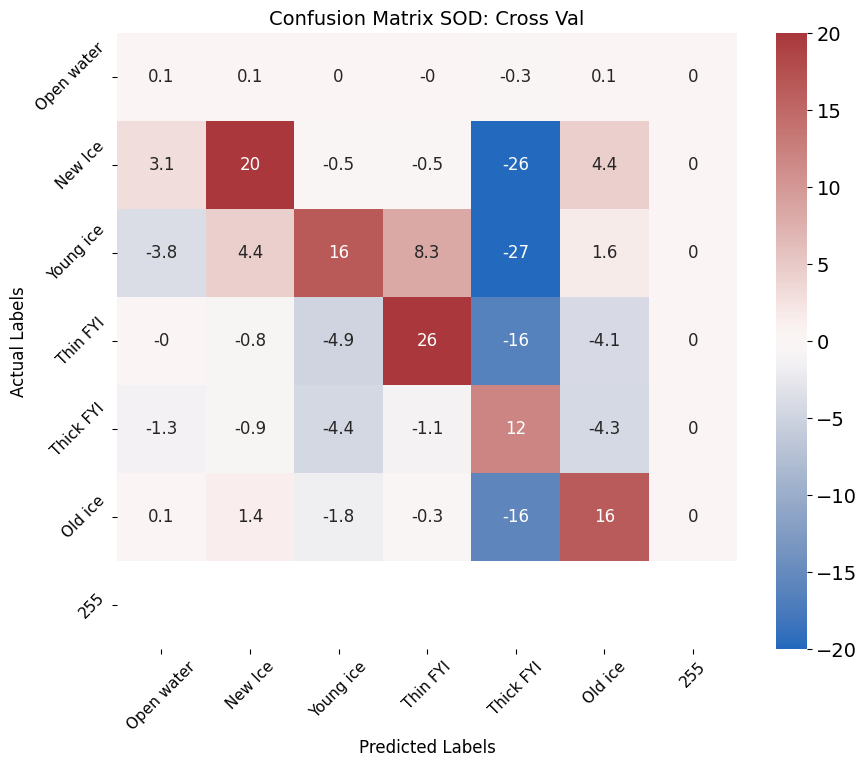

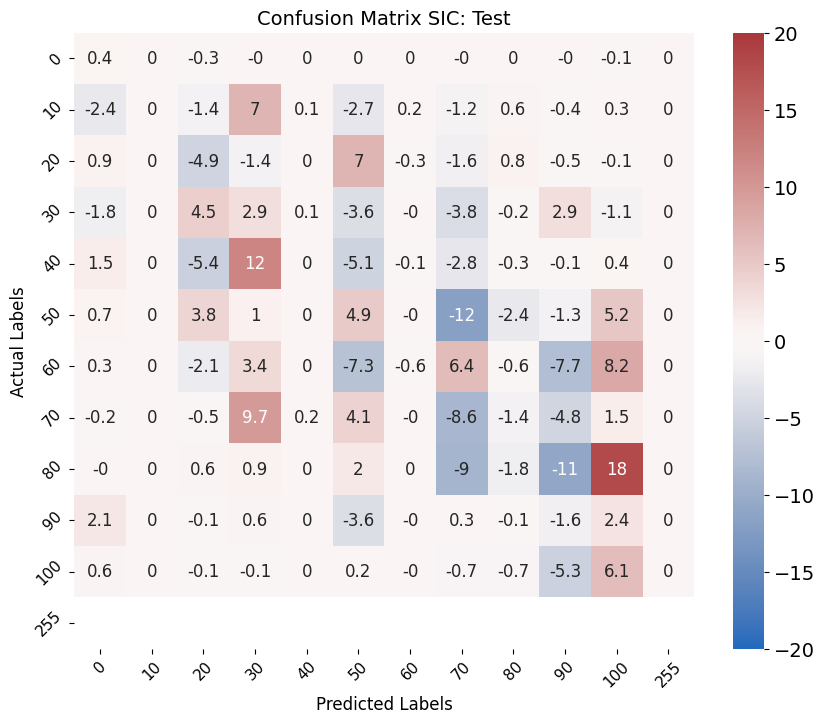

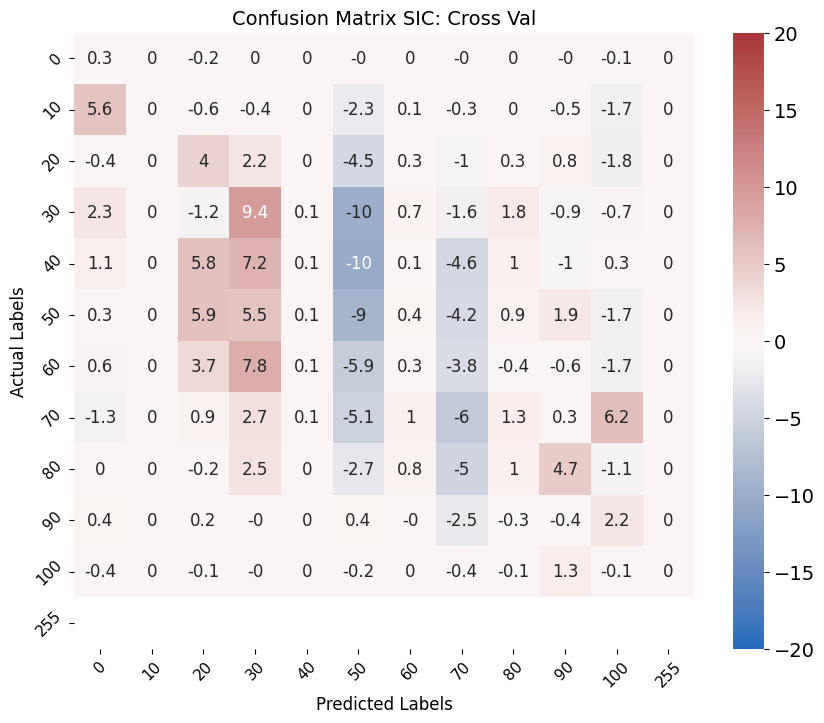

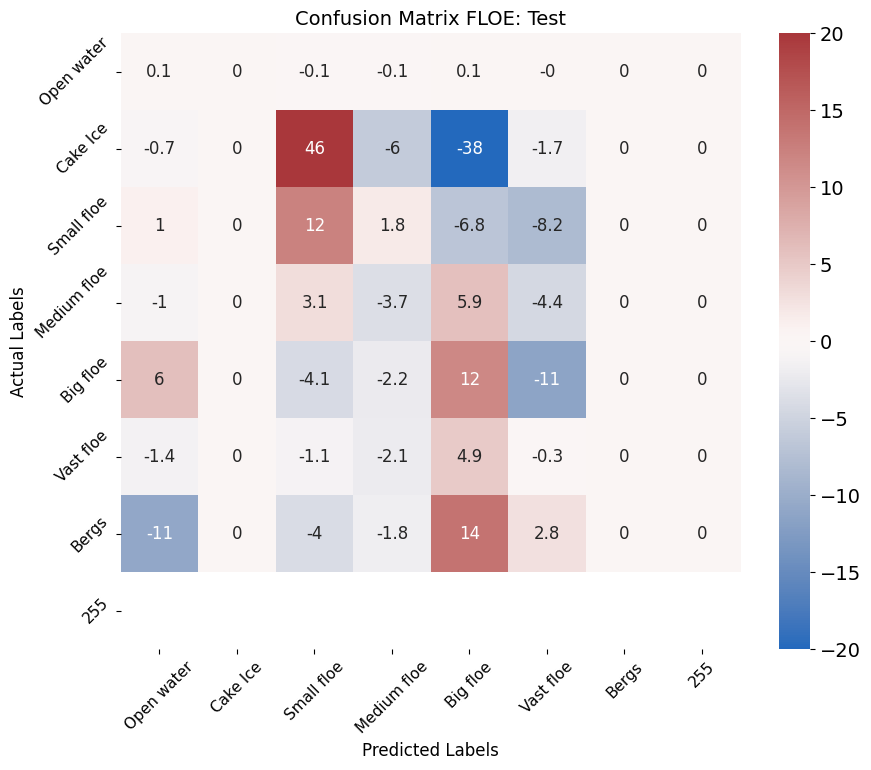

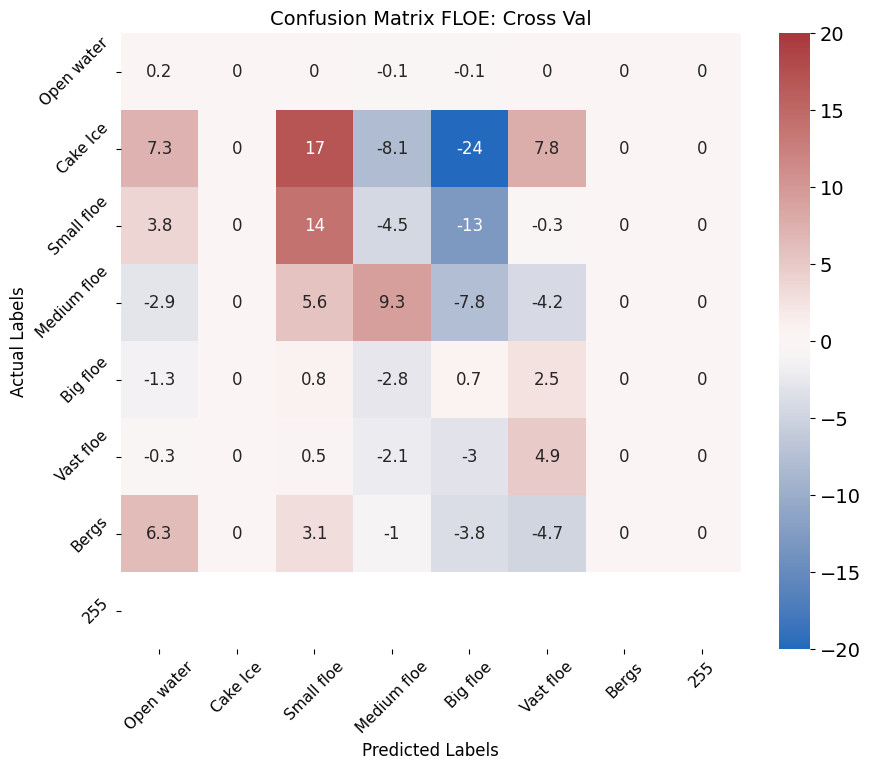

In [8]:
path = 'ai4arctic/feature_selection_rerun_inference_4'
group = 'HH_HV_only'

path_list = ['ai4arctic/feature_selection_rerun_inference_3',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference',
'ai4arctic/feature_selection_rerun_inference_4',
'ai4arctic/feature_selection_base']

group_list = ['HH_HV_IA','HH_HV_DIST','HH_HV_AMSR2_All','HH_HV_enviromental','HH_HV_Location','HH_HV_Time','HH_HV_Time_Location']



cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)

base_mean_cv_sic = get_mean_df(cross_val_sic)
base_mean_cv_sod = get_mean_df(cross_val_sod)
base_mean_cv_floe = get_mean_df(cross_val_floe)

base_mean_test_sic = get_mean_df(test_sic)
base_mean_test_sod = get_mean_df(test_sod)
base_mean_test_floe = get_mean_df(test_floe)


display_cm(base_mean_test_sod,'Confusion Matrix SOD: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sod')
display_cm(base_mean_cv_sod,'Confusion Matrix SOD: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sod')
display_cm(base_mean_test_sic,'Confusion Matrix SIC: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sic')
display_cm(base_mean_cv_sic,'Confusion Matrix SIC: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sic')
display_cm(base_mean_test_floe,'Confusion Matrix FLOE: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_floe')
display_cm(base_mean_cv_floe,'Confusion Matrix FLOE: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_floe')


for path, group in zip(path_list,group_list):
    cross_val_sic, cross_val_sod, cross_val_floe, test_sic, test_sod, test_floe = obtain_confusion_matrix(path,group)

    mean_cv_sic = get_mean_df(cross_val_sic)
    mean_cv_sod = get_mean_df(cross_val_sod)
    mean_cv_floe = get_mean_df(cross_val_floe)

    mean_test_sic = get_mean_df(test_sic)
    mean_test_sod = get_mean_df(test_sod)
    mean_test_floe = get_mean_df(test_floe)


    mean_cv_sic_diff = mean_cv_sic.copy(deep=True)
    mean_cv_sod_diff = mean_cv_sod.copy(deep=True)
    mean_cv_floe_diff = mean_cv_floe.copy(deep=True)

    mean_test_sic_diff = mean_test_sic.copy(deep=True)
    mean_test_sod_diff = mean_test_sod.copy(deep=True)
    mean_test_floe_diff = mean_test_floe.copy(deep=True)



    mean_cv_sic_diff.loc[:,:] = mean_cv_sic.values - base_mean_cv_sic.values
    mean_cv_sod_diff.loc[:,:] = mean_cv_sod.values - base_mean_cv_sod.values 
    mean_cv_floe_diff.loc[:,:] = mean_cv_floe.values - base_mean_cv_floe.values 

    mean_test_sic_diff.loc[:,:] = mean_test_sic.values - base_mean_test_sic.values
    mean_test_sod_diff.loc[:,:] = mean_test_sod.values - base_mean_test_sod.values
    mean_test_floe_diff.loc[:,:] = mean_test_floe.values - base_mean_test_floe.values 


    display_cm(mean_test_sod,'Confusion Matrix SOD: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sod')
    display_cm(mean_cv_sod,'Confusion Matrix SOD: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sod')
    display_cm(mean_test_sic,'Confusion Matrix SIC: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sic')
    display_cm(mean_cv_sic,'Confusion Matrix SIC: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_sic')
    display_cm(mean_test_floe,'Confusion Matrix FLOE: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_floe')
    display_cm(mean_cv_floe,'Confusion Matrix FLOE: Cross Val','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_cv_floe')



    display_cm(mean_test_sod_diff,'Confusion Matrix SOD: Test','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_test_sod')
    display_cm(mean_cv_sod_diff,'Confusion Matrix SOD: Cross Val','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_cv_sod')
    display_cm(mean_test_sic_diff,'Confusion Matrix SIC: Test','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_test_sic')
    display_cm(mean_cv_sic_diff,'Confusion Matrix SIC: Cross Val','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_cv_sic')
    display_cm(mean_test_floe_diff,'Confusion Matrix FLOE: Test','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_test_floe')
    display_cm(mean_cv_floe_diff,'Confusion Matrix FLOE: Cross Val','vlag',rot=45,colour_bar_min_max=[-20,20],save_figure = 'confusion_matrixes/comparison/'+group+'_cv_floe')









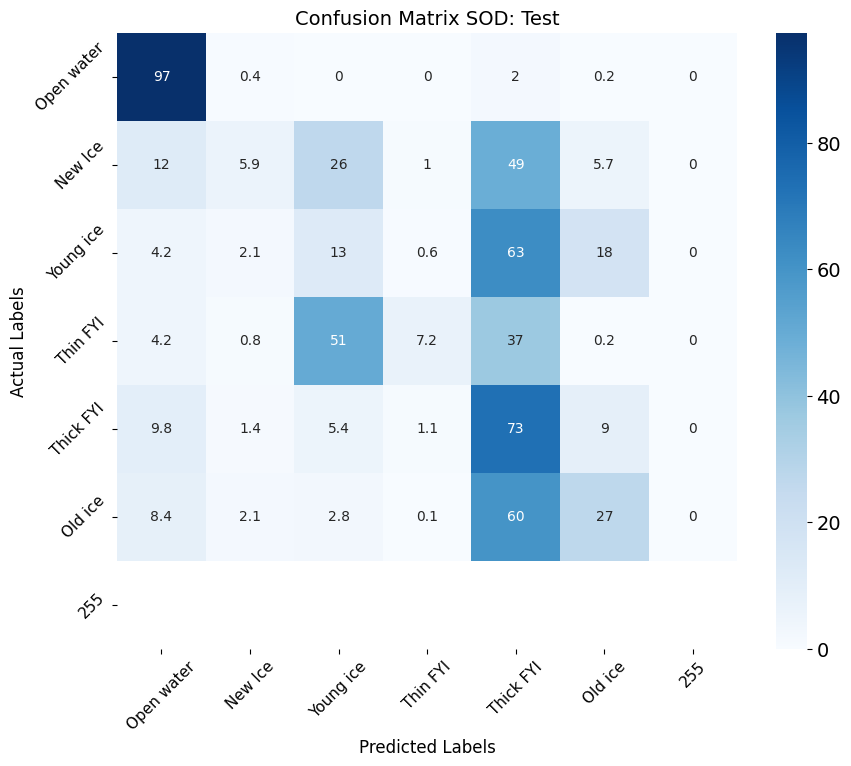

In [36]:
display_cm(base_mean_test_sod,'Confusion Matrix SOD: Test','Blues',rot=45,save_figure = 'confusion_matrixes/'+group+'_test_sod')